# **Project 2 Artificial Vision**

The objective of this project consist in comparing three different Object Detection models and analyze fro their predictions which one is the best for detecting and predicting correctly the bounding boxes and the type of animal. This is pretty useful when it is wanted to create technology for sensors, security cameras or even in facial recognition authentication.

The dataset used comprises 500 images across five animal categories, with each category containing 100 images. The images are sourced from the “Animal Image Dataset (90 Different Animals)”[1] and “Animals Detection Images Dataset”[2]. Additionally the jupyter notebook of the project can also be found in a GitHub repository.[3]

> **Note:** *During the execution of some code blocks it could be possible that some results of the models that are analyzed (as the weights or confusion matrices) are located in a different folder than on a previous execution(because of the settings the model considered during the execution or because of the results of the training that dictated a specific directory. For those cases it would be necessary to check the directory that is indicated on the output of the code block.*

>**Note 2:** *It could happen than a model could provide an error related with the cache values and a cache file that was generated inside of the train folder of the dataset. The recommended solutions for this are to restart the kernel or execution environment, or reopen the browser so the cache of it can be deleted.*

The pipeline performed during the whole project is the next one: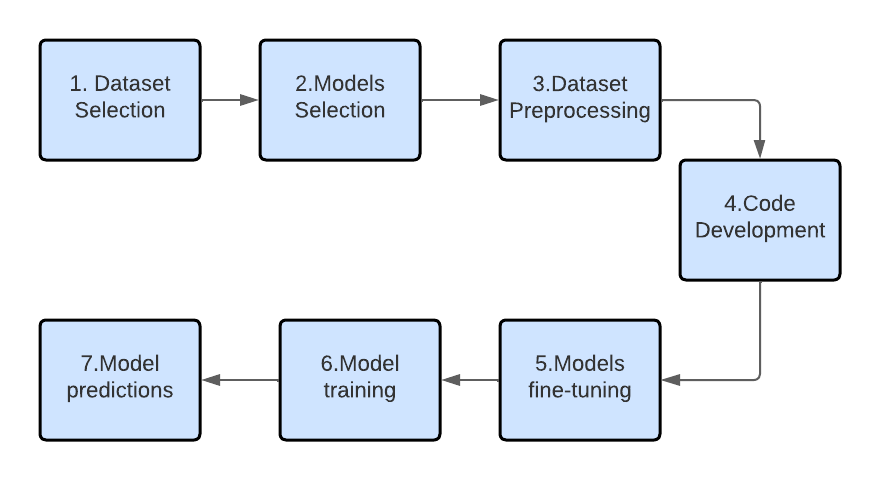

### **Requirements:**
- Python >= 3.9
- Google Account
- Pytorch (last version)

The models used on this project are:
- YOLOv5l [4]
- YOLOv8s [5]
- MMDetection RTMDet [6]

>**Note:** *It must be considered that two of the models where retrieved from a webiste called modelzoo.co[7].*

The reason the previous models where chosen is because they had a lot of documentation available as multiple videos of the community, API's, forums answers or websites, besides their recognition Mean Average Precision, and the multiple possibilities for performing the training and predictions (as making a prediction over a video automatically and generate a video output with the predicted results and bounding boxes, or providing the confusion matrices or because their execution is not so complicated). The main metric consider to evaluate the three models was the Mean Average Precision (especifically 50-95, but also not ignoring the one that is just mAP 50).

## **Step 0. Mount Google Drive Account**

Before starting the development of the project it is necessary to mount your Google Drive Account, so certain files (as the wights or confusion matrices) of the different models that are compared can be saved for a future use. After that it is returned with the command "cd.." to the root directory for purposes of the different paths that are going to be used during the notebook.

In [ ]:
from google.colab import drive
drive.mount('/gdrive', force_remount=True)
%cd /gdrive

print("returning to root dir")
%cd ..

Mounted at /gdrive
/gdrive
returning to root dir
/


## **Step 1. Install Libraries**

On this step all the main required libraries during the whole process of data extraction, model configuration, training and validation are installed. It is necessary to install the specific versions so it could work. On the case of having a different CUDA version installed on your computer it is important to change the "--index-url" value with the link that corresponds to the correct one.

>**Note:** *If you use have CUDA 12.2 installed on your device, then pytorch with CUDA 12.1 version will work perfectly*

In [ ]:
!pip install torch torchvision --index-url https://download.pytorch.org/whl/cu121
!pip install supervision==0.13.0
!pip install torchinfo
!pip install ultralytics

%pip install -U openmim
!mim install "mmengine>=0.7.0"
!mim install "mmcv>=2.0.0rc4"


!rm -rf mmdetection
!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection

%pip install -e .

%cd ..

!git clone https://github.com/ultralytics/yolov5
!cd yolov5 & pip install -r requirements.txt

Looking in indexes: https://download.pytorch.org/whl/cu121
Looking in links: https://download.openmmlab.com/mmcv/dist/cu118/torch2.1.0/index.html
Looking in links: https://download.openmmlab.com/mmcv/dist/cu118/torch2.1.0/index.html
Cloning into 'mmdetection'...
remote: Enumerating objects: 37679, done.
remote: Counting objects: 100% (280/280), done.
remote: Compressing objects: 100% (196/196), done.
remote: Total 37679 (delta 114), reused 187 (delta 80), pack-reused 37399
Receiving objects: 100% (37679/37679), 63.04 MiB | 13.96 MiB/s, done.
Resolving deltas: 100% (25953/25953), done.
/content/mmdetection
Obtaining file:///content/mmdetection
  Preparing metadata (setup.py) ... done
  Attempting uninstall: mmdet
    Found existing installation: mmdet 3.2.0
    Uninstalling mmdet-3.2.0:
      Successfully uninstalled mmdet-3.2.0
  Running setup.py develop for mmdet
/content
Cloning into 'yolov5'...
remote: Enumerating objects: 16074, done.
remote: Counting objects: 100% (18/18), done.
r

## **Step 2. Import Libraries**

This step consist on the import of the main libraries that will be used along the notebook. It was again used the "cd.." command to go back to the main root so the libaries can be imported correctly.

In [ ]:
%cd ..
import torch
from torchvision.io import read_image
from torchvision import transforms as T
from ultralytics import YOLO
import supervision as sv
import subprocess
from torchinfo import summary
import shutil
from pathlib import Path
import os
import random
from termcolor import colored
from IPython.display import display, Image
from IPython import display
!yolo=mode=checks

/


## **Step 2b. Verify the GPU is being used (optional)**

Additionally, it is recommended to verify the GPU that the notebook detects and is being used, so it could be identified if it is being used a GPU or not.

In [ ]:
print(f"Torch version: {torch.version.cuda}")
!nvidia-smi -L
torch.cuda.is_available()
torch.cuda.device_count()
torch.cuda.current_device()
torch.cuda.get_device_name(0)

Torch version: 11.8
GPU 0: Tesla T4 (UUID: GPU-ad163d52-47d3-1fdd-3eea-a2dba60b02a2)


'Tesla T4'

## **Step 3. Download the dataset and models needed**

The next code block is in charge of downloading all the needed files (the different dataset formats and a configuration file) so the notebook functions can work without issues.

It must be noted that they were used three different versions of the same dataset, but that are adapted to the different models they were used on in terms of the way the labels of their bounding boxes are represented. In order to create this variations it was used the Roboflow platform, where by importing any dataset it is possible to set the bounding boxes of each image and relate it to a particular class, to then export it in multiple formats as YOLOv8, YOLOv7, and so on. The next table will show which where the models used, including which are their backbones and the dataset they were trained on as base.
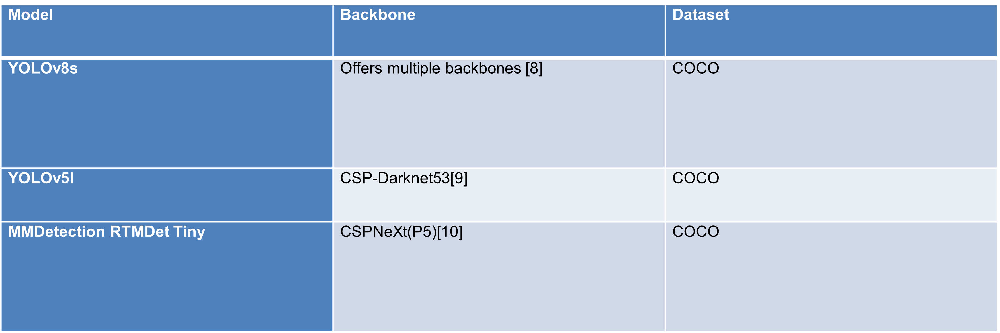

In [ ]:
import requests
def download_dataset():
        url1 = "https://github.com/MegaChestercat/Project-Images/raw/main/Animal.v1i.yolov5pytorch.zip"
        url2 = "https://github.com/MegaChestercat/Project-Images/raw/main/Animal.v1i.yolov8.zip"
        url3 = "https://github.com/MegaChestercat/Project-Images/raw/main/Animal.v1i.coco-mmdetection.zip"
        url4 = "https://github.com/MegaChestercat/Project-Images/raw/main/CustomConfig.yaml"

        response1 = requests.get(url1)
        response2 = requests.get(url2)
        response3 = requests.get(url3)
        response4 = requests.get(url4)


        with open("content/Animal.v1i.yolov5pytorch.zip", "wb") as file:
          file.write(response1.content)
        with open("content/Animal.v1i.yolov8.zip", "wb") as file:
          file.write(response2.content)
        with open("content/Animal.v1i.coco-mmdetection.zip", "wb") as file:
          file.write(response3.content)
        with open("content/CustomConfig.yaml", "wb") as file:
          file.write(response4.content)

        shutil.unpack_archive("content/Animal.v1i.yolov5pytorch.zip", "content/")
        shutil.unpack_archive("content/Animal.v1i.yolov8.zip", "content/")
        shutil.unpack_archive("content/Animal.v1i.coco-mmdetection.zip", "content/")

        print(colored("\nThe dataset and models has been downloaded and unzipped succesfully", "green"))

download_dataset()


The dataset and models has been downloaded and unzipped succesfully


This second code of block will install two additional files important for the model MMDetection RTMDet.

In [ ]:
!mkdir ./content/rtmdet
!mim download mmdet --config rtmdet_tiny_8xb32-300e_coco --dest ./content/rtmdet

processing rtmdet_tiny_8xb32-300e_coco...
downloading ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.9/54.9 MiB 89.5 MB/s eta 0:00:00
Successfully downloaded rtmdet_tiny_8xb32-300e_coco_20220902_112414-78e30dcc.pth to /content/rtmdet
Successfully dumped rtmdet_tiny_8xb32-300e_coco.py to /content/rtmdet


## **Step 3. Create configuration file for the MMDetection RTMDet model**

The next block will define all the necessary configurations for implementing the MMDetection RTMDet model and for its training, validation, and prediction. The code is capable of converting the whole string into a python file.

> **Note:** *If it is wanted to modify a value as the epoch number, the learning rate, the stages that will be freezed or some layers that could be used, it could be modified here.**

In [ ]:
config_animals = """
# Inherit and overwrite part of the config based on this config
_base_ = './rtmdet_tiny_8xb32-300e_coco.py'

data_root = 'content/Animal.v1i.coco-mmdetection/' # dataset root

train_batch_size_per_gpu = 10
train_num_workers = 2

max_epochs = 25
stage2_num_epochs = 1
base_lr = 0.01


metainfo = {
    'classes': ('Crocodile', 'Fox', 'Giraffe', 'Panda', 'Raccoon'),
    'palette': [
        (220, 20, 60), (119, 11, 32), (0, 0, 142), (0, 0, 230), (72, 240, 197)
    ]
}

train_dataloader = dict(
    batch_size=train_batch_size_per_gpu,
    num_workers=train_num_workers,
    dataset=dict(
        data_root=data_root,
        metainfo=metainfo,
        data_prefix=dict(img='train/'),
        ann_file='train/_annotations.coco.json'))

val_dataloader = dict(
    dataset=dict(
        data_root=data_root,
        metainfo=metainfo,
        data_prefix=dict(img='valid/'),
        ann_file='valid/_annotations.coco.json'))

test_dataloader = val_dataloader

val_evaluator = dict(ann_file=data_root + 'valid/_annotations.coco.json')

test_evaluator = val_evaluator

model = dict(bbox_head=dict(num_classes=5))

# learning rate
param_scheduler = [
    dict(
        type='LinearLR',
        start_factor=1.0e-5,
        by_epoch=False,
        begin=0,
        end=10),
    dict(
        # use cosine lr from 10 to 20 epoch
        type='CosineAnnealingLR',
        eta_min=base_lr * 0.05,
        begin=max_epochs // 2,
        end=max_epochs,
        T_max=max_epochs // 2,
        by_epoch=True,
        convert_to_iter_based=True),
]

train_pipeline_stage2 = [
    dict(type='LoadImageFromFile', backend_args=None),
    dict(type='LoadAnnotations', with_bbox=True),
    dict(
        type='RandomResize',
        scale=(640, 640),
        ratio_range=(0.1, 2.0),
        keep_ratio=True),
    dict(type='RandomCrop', crop_size=(640, 640)),
    dict(type='YOLOXHSVRandomAug'),
    dict(type='RandomFlip', prob=0.5),
    dict(type='Pad', size=(640, 640), pad_val=dict(img=(114, 114, 114))),
    dict(type='PackDetInputs')
]

# optimizer
optim_wrapper = dict(
    _delete_=True,
    type='OptimWrapper',
    optimizer=dict(type='AdamW', lr=base_lr, weight_decay=0.0005),
    paramwise_cfg=dict(
        norm_decay_mult=0, bias_decay_mult=0, bypass_duplicate=True))

default_hooks = dict(
    checkpoint=dict(
        interval=5,
        max_keep_ckpts=2,  # only keep latest 2 checkpoints
        save_best='auto'
    ),
    logger=dict(type='LoggerHook', interval=5))

custom_hooks = [
    dict(
        type='PipelineSwitchHook',
        switch_epoch=max_epochs - stage2_num_epochs,
        switch_pipeline=train_pipeline_stage2)
]

# load COCO pre-trained weight
load_from = './content/rtmdet/rtmdet_tiny_8xb32-300e_coco_20220902_112414-78e30dcc.pth'

train_cfg = dict(type='EpochBasedTrainLoop', max_epochs=max_epochs, val_interval=1)
visualizer = dict(vis_backends=[dict(type='LocalVisBackend'),dict(type='TensorboardVisBackend')])
"""

with open('content/rtmdet/rtmdet_tiny_1xb4-20e_animals.py', 'w') as f:
    f.write(config_animals)

## **Step 4. Define the methods for each model and start its training**

The next code blocks will show how the model is defined and how its training and validation is defined, including some results showdown.

**Note:** *This little block of code is give if for any reason it is given during the execution of any of the model an error related with the encoding.*

In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

## **Step 4a. YOLOv5 Model**

Now, it is proceeded with the training of the YOLOv5 model. For it, inside of the used command they were set some parameters as the batch size (10) the size of the images that need to be used for the model (640), the weights that will need to be used, the number of epochs (for this case 25), the dataset that will be trained, and how many layers would be freezed during training.

>**Note:** *If an execution error is given related with cache or a cache file, the it is recommended to restart the kernel of the notebook or reopen the browser to clear the cache it could have*

In [ ]:
!cd ..
!python yolov5/train.py --img 640  --batch 10  --data ./content/Animal.v1i.yolov5pytorch/data.yaml --weights yolov5l.pt --epochs 25 --freeze 10

2023-11-21 20:07:18.307945: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-21 20:07:18.308007: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-21 20:07:18.308050: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5l.pt, cfg=, data=./content/Animal.v1i.yolov5pytorch/data.yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=25, batch_size=10, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer

Then from the training that was done it is checked the confusion matrix generated.

>**Note:** *From the path the fragment "exp2" needs to be changed according to where the results of the training where saved. It is necessary to check that information on the output of the training.*

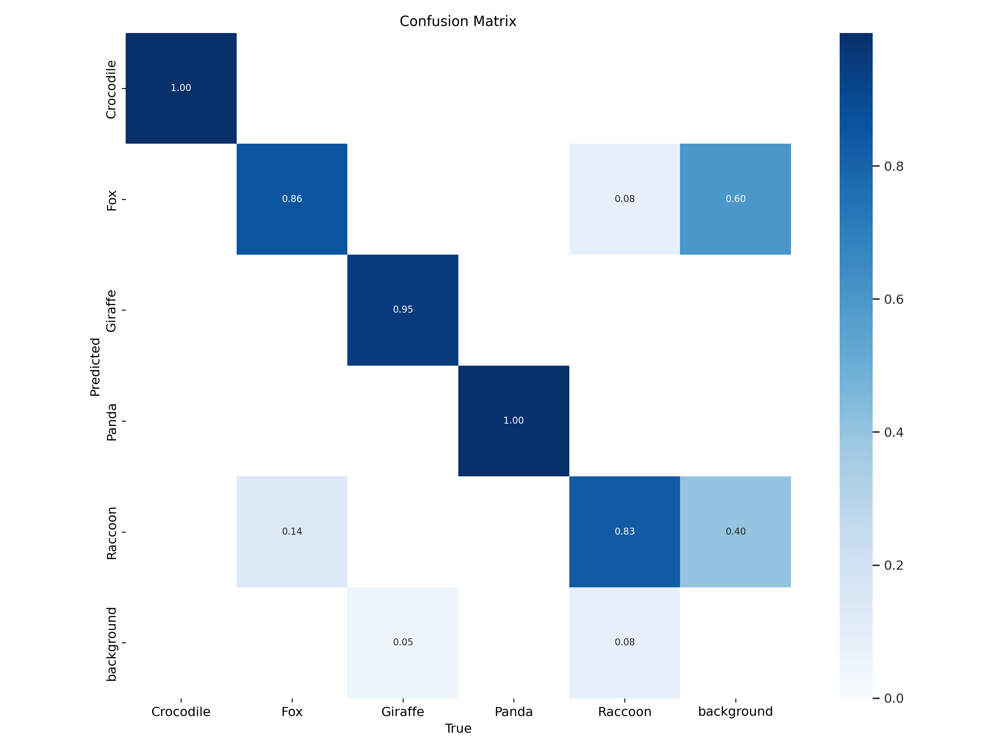

In [ ]:
Image(filename='./yolov5/runs/train/exp2/confusion_matrix.png', width=600)

Additionally, the metrics of the training are also retrieved.
>**Note:** *From the path the fragment "exp2" needs to be changed according to where the results of the training where saved. It is necessary to check that information on the output of the training.*

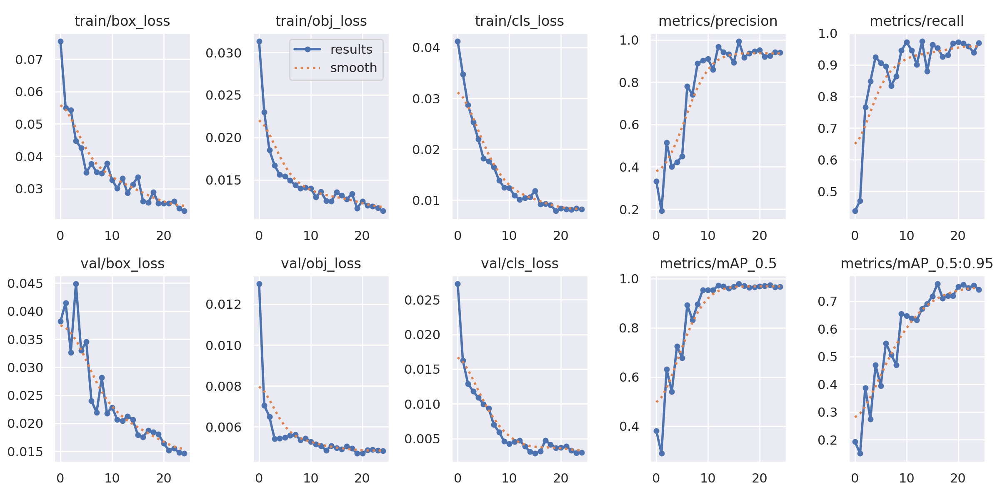

In [ ]:
Image(filename='./yolov5/runs/train/exp2/results.png', width=600)

Also, it is provided some predictions it gave on a validation batch.
>**Note:** *From the path the fragment "exp2" needs to be changed according to where the results of the training where saved. It is necessary to check that information on the output of the training.*

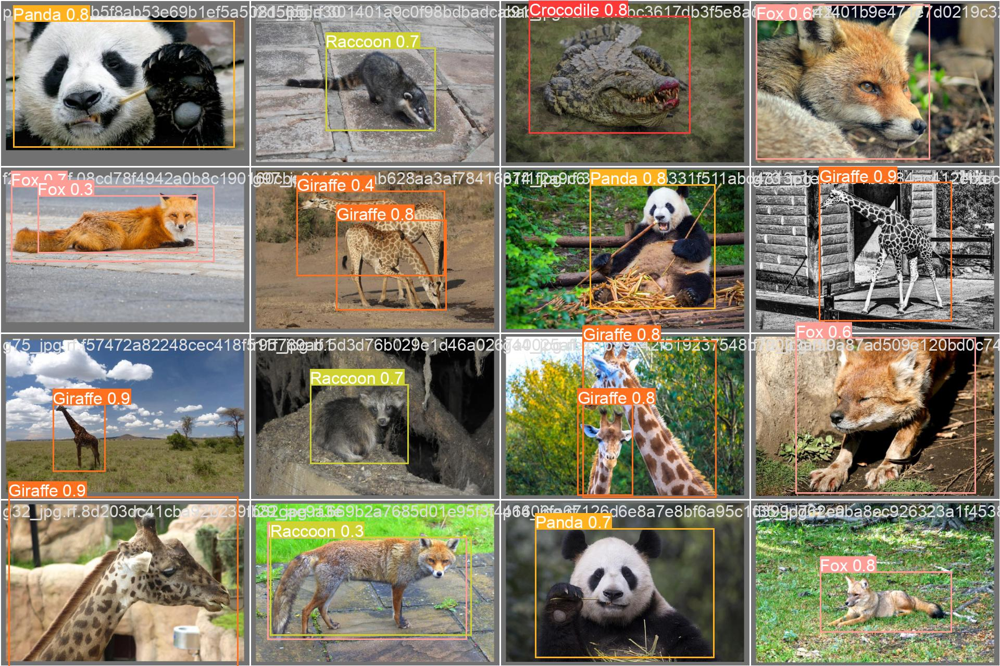

In [ ]:
Image(filename='./yolov5/runs/train/exp2/val_batch0_pred.jpg', width=600)

Now, on this little code block it is performed a valdation by using the best weights generated during training and the validation images.

In [ ]:
%cd ..
!python yolov5/detect.py --weights yolov5/runs/train/exp2/weights/best.pt --img 460 --conf 0.1 --source /content/Animal.v1i.yolov5pytorch/val/images

/
detect: weights=['yolov5/runs/train/exp2/weights/best.pt'], source=/content/Animal.v1i.yolov5pytorch/val/images, data=yolov5/data/coco128.yaml, imgsz=[460, 460], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-245-g3d8f004 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 267 layers, 46129818 parameters, 0 gradients, 107.7 GFLOPs
WARNING ⚠️ --img-size [460, 460] must be multiple of max stride 32, updating to [480, 480]
image 1/50 /content/Animal.v1i.yolov5pytorch/val/images/c100_jpg.rf.e386ea83c25273360a2edbd9b7e45a7a.jpg: 384x480 1 Crocodile, 77.1ms
image 2/50 /content/Animal.v1i.yolov5pytorch/val/images

Then, it is proceeded by saving all the data generated during training into a secure directory.

In [ ]:
!cp -r "./yolov5/" "/gdrive/MyDrive/checkpoints_1/"

## **Step 4b. YOLOv8 Model**

On the next code blocks are performed some operations that refer to the model YOLOv8 configuration and training.
>**Note:** *If an execution error is given related with cache or a cache file, the it is recommended to restart the kernel of the notebook or reopen the browser to clear the cache it could have*

This code block defines a method that helps to freeze certain layers of the model. For the pruposes of this project they were freezed 10 layers.

In [ ]:
def freeze_layer(trainer):
    model = trainer.model
    num_freeze = 10
    print(f"Freezing {num_freeze} layers")
    freeze = [f'model.{x}.' for x in range(num_freeze)]  # layers to freeze
    for k, v in model.named_parameters():
        v.requires_grad = True  # train all layers
        if any(x in k for x in freeze):
            print(f'freezing {k}')
            v.requires_grad = False
    print(f"{num_freeze} layers are freezed.")

Then, this code block defines the YOLOv8 model and runs the previous method.

In [ ]:
modelYolov8 = YOLO("yolov8s.pt")
def Yolov8():
        modelYolov8.add_callback("on_train_start", freeze_layer)
        print(modelYolov8)
        summary(modelYolov8)
Yolov8()

YOLO(
  (model): DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (2): C2f(
        (cv1): Conv(
          (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (act): SiLU(inplace=True)
        )
        (cv2): Conv(
          (conv): Conv2d(96, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_s

Now, the training of the YOLOv8 model can be performed. Some parameters defined are the:
- Epoch Number: 25
- Training Batch Size: 10
- Image size that is needed: 640
- Weight decay: 0.001
- Validation process: true
- Device (GPU that is going to be used): 0
- Model export: True
- Project (location where the results of the model trainng will be saved


In [ ]:
modelYolov8.train(data="content/CustomConfig.yaml", epochs=25, batch=10, imgsz=640, save=True, project= "gdrive/MyDrive/checkpoints_2/", device=0, weight_decay=0.001, val=True)

Ultralytics YOLOv8.0.215 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=content/CustomConfig.yaml, epochs=25, patience=50, batch=10, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=gdrive/MyDrive/checkpoints_2/, name=train10, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchsc

train: Scanning /content/Animal.v1i.yolov8/train/labels... 400 images, 0 backgrounds, 0 corrupt: 100%|██████████| 400/400 [00:00<00:00, 1062.71it/s]

train: New cache created: /content/Animal.v1i.yolov8/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/Animal.v1i.yolov8/valid/labels... 50 images, 0 backgrounds, 0 corrupt: 100%|██████████| 50/50 [00:00<00:00, 547.14it/s]

val: New cache created: /content/Animal.v1i.yolov8/valid/labels.cache


Plotting labels to gdrive/MyDrive/checkpoints_2/train10/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0009375), 63 bias(decay=0.0)
Freezing 10 layers
freezing model.0.conv.weight
freezing model.0.bn.weight
freezing model.0.bn.bias
freezing model.1.conv.weight
freezing model.1.bn.weight
freezing model.1.bn.bias
freezing model.2.cv1.conv.weight
freezing model.2.cv1.bn.weight
freezing model.2.cv1.bn.bias
freezing model.2.cv2.conv.weight
freezing model.2.cv2.bn.weight
freezing model.2.cv2.bn.bias
freezing model.2.m.0.cv1.conv.weight
freezing model.2.m.0.cv1.bn.weight
freezing model.2.m.0.cv1.bn.bias
freezing model.2.m.0.cv2.conv.weight
freezing model.2.m.0.cv2.bn.weight
freezing model.2.m.0.cv2.bn.bias
freezing model.3.conv.weight
freezing model.3.bn.weight
freezing mod

       1/25      1.33G      1.049      2.578      1.481         33        640: 100%|██████████| 40/40 [00:15<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.27it/s]

                   all         50         57      0.669      0.722      0.787      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/25      1.22G     0.9547      1.604       1.38         25        640: 100%|██████████| 40/40 [00:09<00:00,  4.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.65it/s]

                   all         50         57      0.732      0.816       0.89      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/25      1.36G       1.01      1.404       1.43         35        640: 100%|██████████| 40/40 [00:11<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.71it/s]

                   all         50         57      0.591      0.793       0.82      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/25      1.22G      1.016      1.259      1.412         25        640: 100%|██████████| 40/40 [00:10<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.18it/s]

                   all         50         57      0.705      0.803      0.865      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/25      1.23G       1.01      1.131      1.383         27        640: 100%|██████████| 40/40 [00:10<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.64it/s]


                   all         50         57      0.869      0.761      0.918      0.612

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/25      1.22G      1.007      1.153      1.382         28        640: 100%|██████████| 40/40 [00:11<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.26it/s]

                   all         50         57      0.637      0.792      0.836      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/25      1.22G     0.9984      1.075      1.391         26        640: 100%|██████████| 40/40 [00:09<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.59it/s]

                   all         50         57      0.771       0.89       0.85      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/25      1.22G     0.9949      1.092       1.38         21        640: 100%|██████████| 40/40 [00:12<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.43it/s]

                   all         50         57      0.873      0.782      0.869      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/25      1.21G     0.9341     0.9784      1.345         21        640: 100%|██████████| 40/40 [00:08<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.08it/s]

                   all         50         57      0.784        0.9      0.911      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/25      1.22G     0.9003     0.9621      1.319         23        640: 100%|██████████| 40/40 [00:12<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.38it/s]

                   all         50         57      0.885      0.803      0.906      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/25      1.21G     0.8442     0.9291      1.297         34        640: 100%|██████████| 40/40 [00:08<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.57it/s]

                   all         50         57      0.819      0.893       0.89      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/25       1.2G     0.9106     0.9175       1.32         29        640: 100%|██████████| 40/40 [00:13<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.62it/s]


                   all         50         57       0.84      0.793      0.869      0.619

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/25      1.22G     0.8405     0.8545      1.271         36        640: 100%|██████████| 40/40 [00:08<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.87it/s]

                   all         50         57       0.85      0.824      0.899      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/25      1.22G     0.8652     0.8274      1.297         28        640: 100%|██████████| 40/40 [00:12<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.48it/s]

                   all         50         57      0.756      0.892      0.893      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/25      1.22G     0.8026     0.7834      1.246         24        640: 100%|██████████| 40/40 [00:08<00:00,  4.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.91it/s]

                   all         50         57       0.85       0.89      0.898      0.647


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/25      1.36G     0.9057     0.8964      1.452         11        640: 100%|██████████| 40/40 [00:11<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.29it/s]

                   all         50         57      0.745       0.76      0.821      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/25       1.2G     0.8196     0.8376      1.366         10        640: 100%|██████████| 40/40 [00:09<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.58it/s]

                   all         50         57       0.79       0.86        0.9      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/25      1.23G      0.775     0.8052      1.306         10        640: 100%|██████████| 40/40 [00:09<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.96it/s]

                   all         50         57      0.836      0.891      0.924      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/25       1.2G     0.7098     0.7249      1.266         10        640: 100%|██████████| 40/40 [00:11<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.42it/s]

                   all         50         57      0.833      0.879      0.912      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/25      1.22G     0.6867     0.6664      1.259         10        640: 100%|██████████| 40/40 [00:13<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.92it/s]


                   all         50         57      0.869      0.793      0.885       0.65

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/25      1.22G     0.6774     0.6096      1.253         10        640: 100%|██████████| 40/40 [00:10<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.58it/s]

                   all         50         57      0.836      0.894      0.902      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/25      1.22G     0.6728     0.6205      1.238         10        640: 100%|██████████| 40/40 [00:09<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.56it/s]

                   all         50         57      0.784      0.912      0.902      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/25       1.2G     0.6449       0.57      1.198         12        640: 100%|██████████| 40/40 [00:10<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.28it/s]

                   all         50         57      0.829      0.897       0.92      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/25      1.22G     0.6325     0.5701      1.193         12        640: 100%|██████████| 40/40 [00:09<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.90it/s]

                   all         50         57      0.832      0.876      0.917       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/25      1.23G     0.6079     0.5301      1.172         11        640: 100%|██████████| 40/40 [00:09<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.00it/s]

                   all         50         57      0.874      0.874      0.935      0.706



25 epochs completed in 0.089 hours.
Optimizer stripped from gdrive/MyDrive/checkpoints_2/train10/weights/last.pt, 22.5MB
Optimizer stripped from gdrive/MyDrive/checkpoints_2/train10/weights/best.pt, 22.5MB

Validating gdrive/MyDrive/checkpoints_2/train10/weights/best.pt...
Ultralytics YOLOv8.0.215 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11127519 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.88it/s]


                   all         50         57      0.874      0.873      0.935      0.706
             Crocodile         50          8      0.861      0.875      0.907      0.596
                   Fox         50          7      0.867      0.933      0.978      0.831
               Giraffe         50         22      0.912      0.818      0.949      0.742
                 Panda         50          8      0.879      0.907      0.982      0.805
               Raccoon         50         12      0.851      0.833      0.858      0.557
Speed: 0.3ms preprocess, 7.0ms inference, 0.0ms loss, 4.5ms postprocess per image
Results saved to gdrive/MyDrive/checkpoints_2/train10


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b62909b0e80>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
        

Then from the training that was done, it can be checked the confusion matrix that was generated.

>**Note:** *From the path the fragment "train10" needs to be changed according to where the results of the training where saved. It is necessary to check that information on the output of the training.*

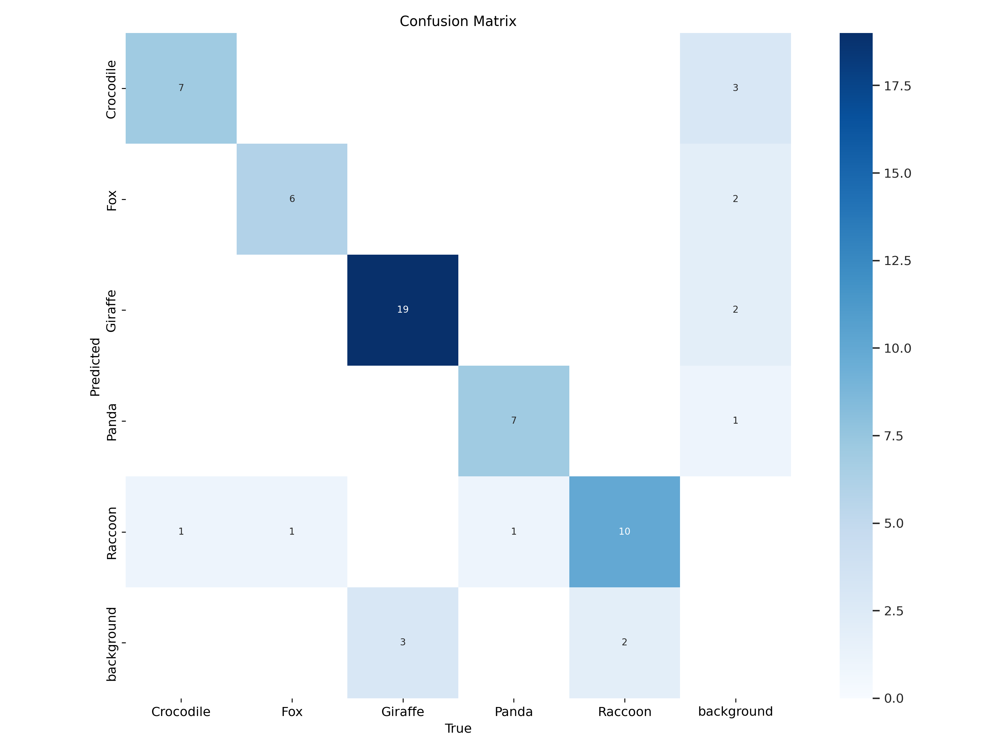

In [ ]:
Image(filename=f'gdrive/MyDrive/checkpoints_2/train10/confusion_matrix.png', width=600)

Also, the fine-tuned model is validated, in order to check how it performs with data that was not set on the training of the model.
>**Note:** *From the path the fragment "train10" needs to be changed according to where the results of the training where saved. It is necessary to check that information on the output of the training.*

In [ ]:
modelYolov8.val(data="content/CustomConfig.yaml", model="gdrive/MyDrive/checkpoints_2/train10/weights/best.pt")

Ultralytics YOLOv8.0.215 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11127519 parameters, 0 gradients, 28.4 GFLOPs


val: Scanning /content/Animal.v1i.yolov8/valid/labels.cache... 50 images, 0 backgrounds, 0 corrupt: 100%|██████████| 50/50 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.72it/s]


                   all         50         57      0.874      0.874      0.935      0.706
             Crocodile         50          8      0.861      0.875      0.907      0.596
                   Fox         50          7      0.867      0.934      0.978      0.831
               Giraffe         50         22      0.913      0.818      0.948       0.74
                 Panda         50          8      0.879      0.908      0.982      0.805
               Raccoon         50         12      0.851      0.833      0.858      0.557
Speed: 1.9ms preprocess, 27.6ms inference, 0.0ms loss, 3.6ms postprocess per image
Results saved to gdrive/MyDrive/checkpoints_2/train102


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b6477b73b80>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
        

## **Step 4c. RTMDet Model**

On the next blocks of code are going to be performed some operations for training the MMDetection RTMDet Model, including the visualization of some of the metrics.

On this code block it is started the model training, and it is defined the location of the file that allows the training of the model and also the file that defines the model that is being used.

>**Note:** *All the setting regarding the training, including the dataset that will be used, are detected automatically by the command.*

In [ ]:
%cd ..
!python ./mmdetection/tools/train.py ./content/rtmdet/rtmdet_tiny_1xb4-20e_animals.py

/
11/21 20:41:42 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.10.12 (main, Jun 11 2023, 05:26:28) [GCC 11.4.0]
    CUDA available: True
    numpy_random_seed: 1501584390
    GPU 0: Tesla T4
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 11.8, V11.8.89
    GCC: x86_64-linux-gnu-gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
    PyTorch: 2.1.0+cu118
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v3.1.1 (Git Hash 64f6bcbcbab628e96f33a62c3e975f8535a7bde4)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX512
  - CUDA Runtime 11.8
  - NVCC architecture flags: -gencode;arch=compute_50,code=sm_50;-gencode;arch=compu

Once the model finished its training, then the results are saved on a secure directory.

In [ ]:
!cp -r "./work_dirs/" "/gdrive/MyDrive/checkpoints_3/"

This code block contains two commands that will help to reinstall the library "mmdet(or mmdetection)" in such a way it can be identified by Python and imported correctly.

In [ ]:
!mim uninstall mmdet
!mim install mmdet

Looking in links: https://download.openmmlab.com/mmcv/dist/cu118/torch2.1.0/index.html


Then, some paths and variables are defined, that will help to generate a confusion matrix of the model, and also includng a prediction (in a later step).

In [ ]:
from mmdet.apis import init_detector, inference_detector
import numpy as np

DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
CUSTOM_CONFIG_PATH = "./gdrive/MyDrive/checkpoints_3/work_dirs/rtmdet_tiny_1xb4-20e_animals/rtmdet_tiny_1xb4-20e_animals.py"
CUSTOM_WEIGHTS_PATH = "./gdrive/MyDrive/checkpoints_3/work_dirs/rtmdet_tiny_1xb4-20e_animals/best_coco_bbox_mAP_epoch_24.pth"

model = init_detector(CUSTOM_CONFIG_PATH, CUSTOM_WEIGHTS_PATH, device=DEVICE)

ds = sv.DetectionDataset.from_coco(
    images_directory_path="./content/Animal.v1i.coco-mmdetection/test",
    annotations_path="./content/Animal.v1i.coco-mmdetection/test/_annotations.coco.json",
)

print('dataset classes:', ds.classes)
print('dataset size:', len(ds))

def callback(image: np.ndarray) -> sv.Detections:
    result = inference_detector(model, image)
    detections = sv.Detections.from_mmdetection(result)
    return detections[detections.confidence > 0.25].with_nms(threshold=0.7)


confusion_matrix = sv.ConfusionMatrix.benchmark(
    dataset = ds,
    callback = callback
)

_ = confusion_matrix.plot()

Now, the next code will show how to retrieve the results of the metrics of the model with the best weights.

In [ ]:
mean_average_precision = sv.MeanAveragePrecision.benchmark(
    dataset = ds,
    callback = callback
)

print('mAP:', mean_average_precision.map50_95)

per_class_map = mean_average_precision.per_class_ap50_95.mean(axis=1)
for class_name, value in zip(ds.classes, per_class_map):
    print(f"{class_name}: {value:.2f}")

mAP: 0.08069994698634698
Crocodile: 0.00
Fox: 0.00
Giraffe: 0.11
Panda: 0.29
Raccoon: 0.00


## **Step 5. Download the video for performing the model predictions**

It is installed the pytube library so it can be downloaded the video that will be predicted by the three models.

In [ ]:
!pip install pytube

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 1.8 MB/s eta 0:00:00


Now, it is performed the download of the video and saved on the content folder.

In [ ]:
import pytube

video = pytube.YouTube('https://youtu.be/sG4ACWQj_sQ')
download = video.streams.get_highest_resolution()
download.download("./content/")

'/./content/Animales.mp4'

## **Step 6. Perform the model predictions over the video**

On this step there is going to be performed the predictions by the three models over the video that was downloaded in step 5.

First it is performed the prediction with the YOLOv5 model. It must be taken into account that the weights that are use correspond to the ones that were retrieved during the training (specially the ones marked as the "best"). The generated prediction will be saved on a secure directory. Additionally, the confidence threshold by default on this model is of 0.25, so values lesser than that will be ignored by the predictor.
>**Note:** *From the path the fragment "exp2" needs to be changed according to where the results of the training where saved. It is necessary to check that information on the output of the training.*

In [ ]:
%cd ..
!python ./yolov5/detect.py --weights ./gdrive/MyDrive/checkpoints_1/runs/train/exp2/weights/best.pt --source ./content/Animales.mp4 --project  ./gdrive/MyDrive/video2/

/
detect: weights=['./gdrive/MyDrive/checkpoints_1/runs/train/exp2/weights/best.pt'], source=./content/Animales.mp4, data=yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=./gdrive/MyDrive/video2/, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-245-g3d8f004 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 267 layers, 46129818 parameters, 0 gradients, 107.7 GFLOPs
video 1/1 (1/4556) /content/Animales.mp4: 384x640 1 Fox, 1 Giraffe, 2 Pandas, 47.4ms
video 1/1 (2/4556) /content/Animales.mp4: 384x640 1 Fox, 1 Giraffe, 2 Pandas, 31.5ms
video 1/1 (3/4556) /content/Animales.mp4: 384x640 1 Fox, 1 Giraffe, 2 Pandas, 31.4ms
video 1/1 (4/455

Then, the prediction with the YOLOv8 trained model over the video is performed. It is also set the confidence threshold in 0.25, so values lesser than that are ignored by the predictor.
>**Note:** *From the path the fragment "train10" needs to be changed according to where the results of the training where saved. It is necessary to check that information on the output of the training.*

In [ ]:
!yolo task=detect mode=predict model=./gdrive/MyDrive/checkpoints_2/train10/weights/best.pt conf=0.25 source=./content/Animales.mp4 save=True

Ultralytics YOLOv8.0.215 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11127519 parameters, 0 gradients, 28.4 GFLOPs

video 1/1 (1/4556) /content/Animales.mp4: 384x640 1 Crocodile, 1 Fox, 1 Giraffe, 1 Panda, 1 Raccoon, 102.1ms
video 1/1 (2/4556) /content/Animales.mp4: 384x640 1 Crocodile, 1 Fox, 1 Giraffe, 1 Panda, 1 Raccoon, 11.1ms
video 1/1 (3/4556) /content/Animales.mp4: 384x640 1 Crocodile, 1 Fox, 1 Giraffe, 1 Panda, 1 Raccoon, 11.0ms
video 1/1 (4/4556) /content/Animales.mp4: 384x640 1 Crocodile, 2 Foxs, 1 Giraffe, 1 Panda, 1 Raccoon, 11.0ms
video 1/1 (5/4556) /content/Animales.mp4: 384x640 1 Crocodile, 1 Fox, 1 Giraffe, 1 Panda, 1 Raccoon, 11.1ms
video 1/1 (6/4556) /content/Animales.mp4: 384x640 1 Crocodile, 1 Fox, 1 Giraffe, 1 Panda, 1 Raccoon, 11.0ms
video 1/1 (7/4556) /content/Animales.mp4: 384x640 1 Crocodile, 1 Fox, 1 Giraffe, 1 Panda, 1 Raccoon, 11.0ms
video 1/1 (8/4556) /content/Animales.mp4: 384x640 1 Crocodile, 1 Fox, 1 

Once the previous code was executed, now the generated video is sent to a more secure directory.

In [ ]:
!cp -r "./runs/detect/predict/Animales.avi" "/gdrive/MyDrive/video1/"

Now, for the next code block it is perfomed the definition and execution of a method that helps to divide the video by individual frames, so the prediction with the MMDetection RTMDet model over each image can be performed.

In [ ]:
import cv2
import os

def video_to_frames(video_path, output_folder):
    # Open the video file
    cap = cv2.VideoCapture(video_path)

    # Create the output folder if it doesn't exist
    os.makedirs(output_folder, exist_ok=True)

    # Get video properties
    fps = cap.get(cv2.CAP_PROP_FPS)

    # Loop through frames and save each frame as an image
    frame_count = 0
    while True:
        ret, frame = cap.read()

        if not ret:
            break

        # Save the frame as an image
        frame_count += 1
        frame_filename = f"{output_folder}/frame_{frame_count}.jpg"
        cv2.imwrite(frame_filename, frame)
        print(f"Saving frame {frame_count}")

    # Release the video capture object
    cap.release()

# Example usage
video_path = './content/Animales.mp4'
output_folder = './content/frames'
video_to_frames(video_path, output_folder)

Next, the some statements are defined so the prediction over each can be performed succesfully and saved on the provided path.

In [ ]:
from mmdet.apis import DetInferencer
import glob

config = CUSTOM_CONFIG_PATH

# Setup a checkpoint file to load
checkpoint = glob.glob(CUSTOM_WEIGHTS_PATH)[0]

# A device to be used for evaluation is defined
device = 'cuda:0'

inferencer = DetInferencer(config, checkpoint, device)

image_files = [f for f in os.listdir('./content/frames') if f.endswith('.jpg')]
image_files.sort()

counter = 0

# There are performed inferences over each frame
for image_file in image_files:
    counter += 1
    print(f"Frame {counter}")
    image_path = os.path.join('./content/frames', image_file)
    result = inferencer(image_path, out_dir='./content/output/')

Loads checkpoint by local backend from path: ./gdrive/MyDrive/checkpoints_3/work_dirs/rtmdet_tiny_1xb4-20e_animals/best_coco_bbox_mAP_epoch_23.pth


Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

AssertionError: ignored

Then, over the generated output frames with the resulting prediction, there is generated a video in MP4 format of the exact same duration and frame rate as the original.

It must be noted that there are some frames that do not correspond correctly in the generated video, but in overall, the majority are applied correctly.

In [ ]:
import os
import imageio

def frames_to_video(input_folder, output_video_path, fps):
    # Get the list of image files in the input folder
    image_files = [f for f in os.listdir(input_folder) if f.endswith('.jpg')]

    # Sort the image files based on their names
    image_files.sort()

    # Create a writer object
    writer = imageio.get_writer(output_video_path, fps=fps)

    # Write each image to the video
    for image_file in image_files:
        image_path = os.path.join(input_folder, image_file)
        frame = imageio.imread(image_path)
        writer.append_data(frame)

    # Close the writer object
    writer.close()


input_folder = './content/output/vis/'
output_video_path = './gdrive/MyDrive/video3/output_video.mp4'
fps = 25

frames_to_video(input_folder, output_video_path, fps)

## **Step 7. Play the three videos on the same window (optional)**

The next code block what it does is reading the generated predicted outputs of each of the models (YOLOV5, YOLOv8, and MMDetection RTMDet) and playing them alongside on the same window so they can be compared their bounding boxes at the same time and check which one performed better on the given context.

It is important to set correctly the path where the videos predicted are located so the script can load them.

>**Note:** *This block of code is optional to execute in the notebook, because there is a high probability Colab could crash if it is tried to be executed. It is more recommended to run this block as a individual code inside a .py file, and downloading the predicted videos on your device so you can test on them.*

In [ ]:
import cv2

video1 = cv2.VideoCapture('Animales.avi')
video2 = cv2.VideoCapture('Animales.avi')
video3 = cv2.VideoCapture('Animales.avi')


if not video1.isOpened() or not video2.isOpened() or not video3.isOpened():
    print("Error: Couldn't open videos")
    exit()

# Get the video properties
fps = int(video1.get(cv2.CAP_PROP_FPS))
width = int(video1.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(video1.get(cv2.CAP_PROP_FRAME_HEIGHT))


window_width = 1080
window_height = 720

# Create a VideoWriter object to write the output video
output_video = cv2.VideoWriter('combined_video.mp4', cv2.VideoWriter_fourcc(*'mp4v'), fps, (width * 2, height))

# Create a named window with the specified size
cv2.namedWindow('Combined Video', cv2.WINDOW_NORMAL)
cv2.resizeWindow('Combined Video', window_width, window_height)

paused = False

while True:
    if not paused:
      ret1, frame1 = video1.read()
      ret2, frame2 = video2.read()
      ret3, frame3 = video3.read()

      # Resize the frames to the same size (assuming both videos have the same resolution)
      frame2 = cv2.resize(frame2, (width, height))
      frame3 = cv2.resize(frame3, (width, height))

      # Combine the frames horizontally
      combined_frame_horizontal = cv2.hconcat([frame1, frame3])

      combined_frame_vertical = cv2.vconcat([combined_frame_horizontal, np.zeros_like(combined_frame_horizontal)])
      combined_frame_vertical[height:height*2, 0:width] = frame2

      # Add labels to identify each video
      cv2.putText(combined_frame_vertical, 'YOLOv8', (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
      cv2.putText(combined_frame_vertical, 'YOLOv5', (width + 10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
      cv2.putText(combined_frame_vertical, 'Video 3', (0, height + 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)


      cv2.imshow('Combined Video', combined_frame_vertical)

      # Write the frame to the output video
      output_video.write(combined_frame_vertical)

    # Break the loop if the 'q' key is pressed
    if cv2.waitKey(25) & 0xFF == ord('q'):
        break
    elif cv2.waitKey(25) & 0xFF == ord('p'):
        paused = not paused

# Release video capture and writer objects
video1.release()
video2.release()
video3.release()
output_video.release()

# Destroy OpenCV windows
cv2.destroyAllWindows()

Some results of the predicted outputs of the three models comparison are presented:
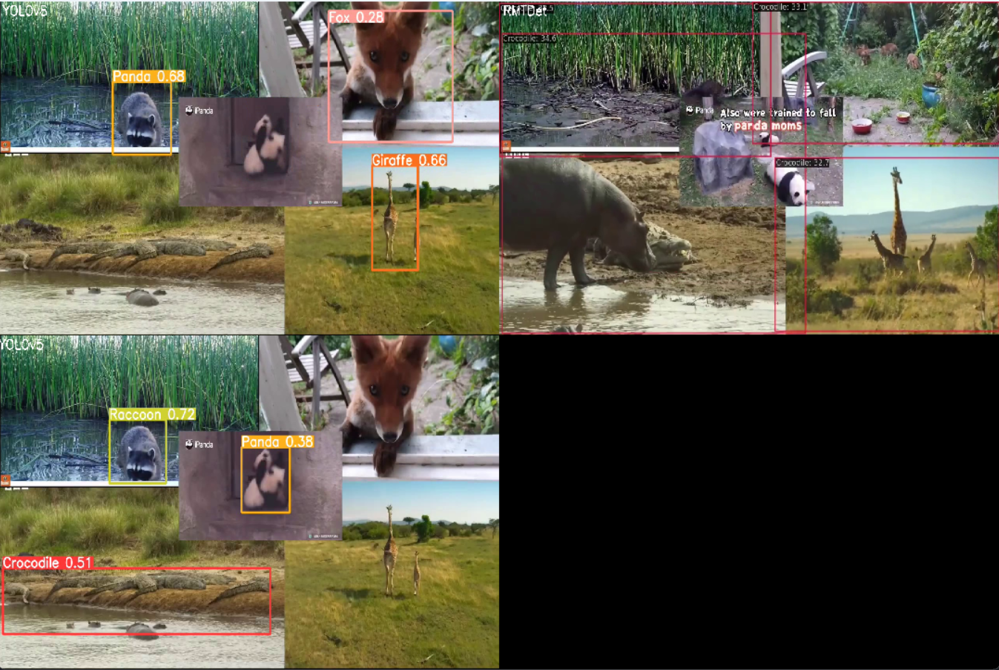

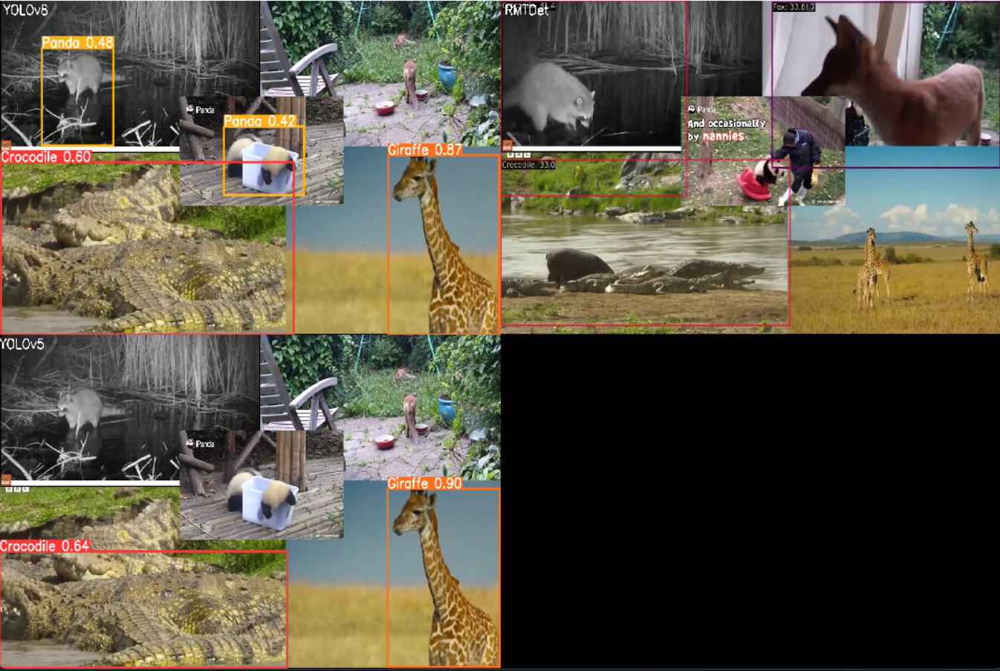

## **Results**

As it was observed on multiple training executions of the three models and on the video comparison of all three, the models in general had a good performance in terms of speed and accuracy of what they had originally (without training and/or fine-tuning), but in particular YOLOv8 had better results in terms of the Average Mean Precision than the other two.

The actual ranking they could have for the purpose that was set on this project and with the given parameters, and by also taking into account previous exeuctions and the prediction over the proposed video is:
1. YOLOv8s
2. YOLOv5l
3. MMDetection RTMDet

In particular RTMDet was the one with the lowest results of all three, providing even on the confusion matrix multiple values that are not recognized correctly. The solution for this has to do with more training of the model, a change in the learning rate or optimizer, freezing some layers, or even adding some more layers to the model.

So in overall, it is possible to say that the winner of this comparison for the particular purpose (classifying five different animals) is YOLOv8 model.

## **Conclusion**

- All the three models have a good general performance in comparison with their base wights.
- The best model among the three is the YOLOv8
- In order to improve the accuracy of the worst model (RTMDet) it is necessary to make some adjustments on the hyperparameters, freezed layers or additional layers.

## **References**

[1] S. Banerjee. "Animal Image Dataset (90 Different Animals)“. Kaggle. https://www.kaggle.com/datasets/iamsouravbanerjee/animal-image-dataset-90-different-animals/data (accessed: Nov. 17, 2023).

[2] "Animals Detection Images Dataset“. Kaggle. https://www.kaggle.com/datasets/antoreepjana/animals-detection-images-dataset?select=test (accessed: Nov. 17, 2023).

[3] M. A. Sánchez Ruelas. Animal-BoVW-Classifier. GitHub. https://github.com/MegaChestercat/Project2_Artificial_Vision (accessed: Nov. 20, 2023).

[4] "yolov5". GitHub. https://github.com/ultralytics/yolov5 (accessed: Nov, 17, 2023).

[5] "ultralytics". GitHub. https://github.com/ultralytics/ultralytics (accessed: Nov 17, 2023).

[6] "mmdetection". GitHub. https://github.com/open-mmlab/mmdetection/tree/main (accessed: Nov. 15, 2023).

[7] "Model Zoo". Model Zoo. https://modelzoo.co/ (accessed: Nov. 13, 2023).

[8] A. Mehra. “Understanding YOLOv8 Architecture, Applications & Features“. Labellerr. https://www.labellerr.com/blog/understanding-yolov8-architecture-applications-features/ (accessed: Nov. 18, 2023).

[9] "Ultralytics YOLOv5 Architecture “. Ultralytics. https://docs.ultralytics.com/yolov5/tutorials/architecture_description/ (accessed: Nov. 18, 2023).

[10] “Object Detection”. GitHub. https://github.com/open-mmlab/mmdetection/blob/main/demo/MMDet_Tutorial.ipynb (accessed: Nov. 19, 2023).